Data can be found here:

https://www.kaggle.com/datasets/mrmorj/dataset-of-songs-in-spotify/code

# **Imports**

In [1]:
# importing pandas, numpy, plotly, seaborn, and itializing the libs
import pandas as pd
import numpy as np
import plotly.express as px
import matplotlib.pyplot as plt
import seaborn as sns
from plotly.subplots import make_subplots
import plotly.graph_objs as go
import plotly.offline as pyo
from sklearn.preprocessing import OrdinalEncoder, StandardScaler
# iterative imputation with sklearn
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
from sklearn.linear_model import BayesianRidge
pyo.init_notebook_mode()

# **Exploratory Data Analysis (EDA)**

In [2]:
df_genre = pd.read_csv('genres_v2.csv')
df_genre.head()

<ipython-input-2-990f6cad220c>:1: DtypeWarning:

Columns (19) have mixed types. Specify dtype option on import or set low_memory=False.



,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,...,id,uri,track_href,analysis_url,duration_ms,time_signature,genre,song_name,Unnamed: 0,title
0,0.831,0.814,2,-7.364,1,0.4200,0.0598,0.013400,0.0556,0.3890,...,2Vc6NJ9PW9gD9q343XFRKx,spotify:track:2Vc6NJ9PW9gD9q343XFRKx,https://api.spotify.com/v1/tracks/2Vc6NJ9PW9gD...,https://api.spotify.com/v1/audio-analysis/2Vc6...,124539,4,Dark Trap,Mercury: Retrograde,NaN,NaN
1,0.719,0.493,8,-7.230,1,0.0794,0.4010,0.000000,0.1180,0.1240,...,7pgJBLVz5VmnL7uGHmRj6p,spotify:track:7pgJBLVz5VmnL7uGHmRj6p,https://api.spotify.com/v1/tracks/7pgJBLVz5Vmn...,https://api.spotify.com/v1/audio-analysis/7pgJ...,224427,4,Dark Trap,Pathology,NaN,NaN
2,0.850,0.893,5,-4.783,1,0.0623,0.0138,0.000004,0.3720,0.0391,...,0vSWgAlfpye0WCGeNmuNhy,spotify:track:0vSWgAlfpye0WCGeNmuNhy,https://api.spotify.com/v1/tracks/0vSWgAlfpye0...,https://api.spotify.com/v1/audio-analysis/0vSW...,98821,4,Dark Trap,Symbiote,NaN,NaN
3,0.476,0.781,0,-4.710,1,0.1030,0.0237,0.000000,0.1140,0.1750,...,0VSXnJqQkwuH2ei1nOQ1nu,spotify:track:0VSXnJqQkwuH2ei1nOQ1nu,https://api.spotify.com/v1/tracks/0VSXnJqQkwuH...,https://api.spotify.com/v1/audio-analysis/0VSX...,123661,3,Dark Trap,ProductOfDrugs (Prod. The Virus and Antidote),NaN,NaN
4,0.798,0.624,2,-7.668,1,0.2930,0.2170,0.000000,0.1660,0.5910,...,4jCeguq9rMTlbMmPHuO7S3,spotify:track:4jCeguq9rMTlbMmPHuO7S3,https://api.spotify.com/v1/tracks/4jCeguq9rMTl...,https://api.spotify.com/v1/audio-analysis/4jCe...,123298,4,Dark Trap,Venom,NaN,NaN


In [3]:
df_genre.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 42305 entries, 0 to 42304
Data columns (total 22 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   danceability      42305 non-null  float64
 1   energy            42305 non-null  float64
 2   key               42305 non-null  int64  
 3   loudness          42305 non-null  float64
 4   mode              42305 non-null  int64  
 5   speechiness       42305 non-null  float64
 6   acousticness      42305 non-null  float64
 7   instrumentalness  42305 non-null  float64
 8   liveness          42305 non-null  float64
 9   valence           42305 non-null  float64
 10  tempo             42305 non-null  float64
 11  type              42305 non-null  object 
 12  id                42305 non-null  object 
 13  uri               42305 non-null  object 
 14  track_href        42305 non-null  object 
 15  analysis_url      42305 non-null  object 
 16  duration_ms       42305 non-null  int64 

In [4]:
100*df_genre.isna().sum()/len(df_genre)

danceability         0.000000
energy               0.000000
key                  0.000000
loudness             0.000000
mode                 0.000000
speechiness          0.000000
acousticness         0.000000
instrumentalness     0.000000
liveness             0.000000
valence              0.000000
tempo                0.000000
type                 0.000000
id                   0.000000
uri                  0.000000
track_href           0.000000
analysis_url         0.000000
duration_ms          0.000000
time_signature       0.000000
genre                0.000000
song_name           49.133672
Unnamed: 0          50.880511
title               50.880511
dtype: float64

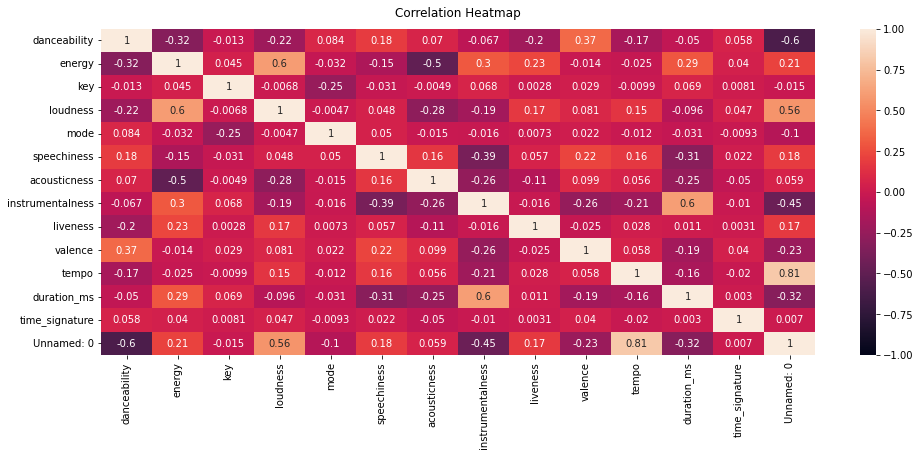

In [5]:
plt.figure(figsize=(16, 6))
heatmap = sns.heatmap(df_genre.corr(), vmin=-1, vmax=1, annot=True)
heatmap.set_title('Correlation Heatmap', fontdict={'fontsize':12}, pad=12);

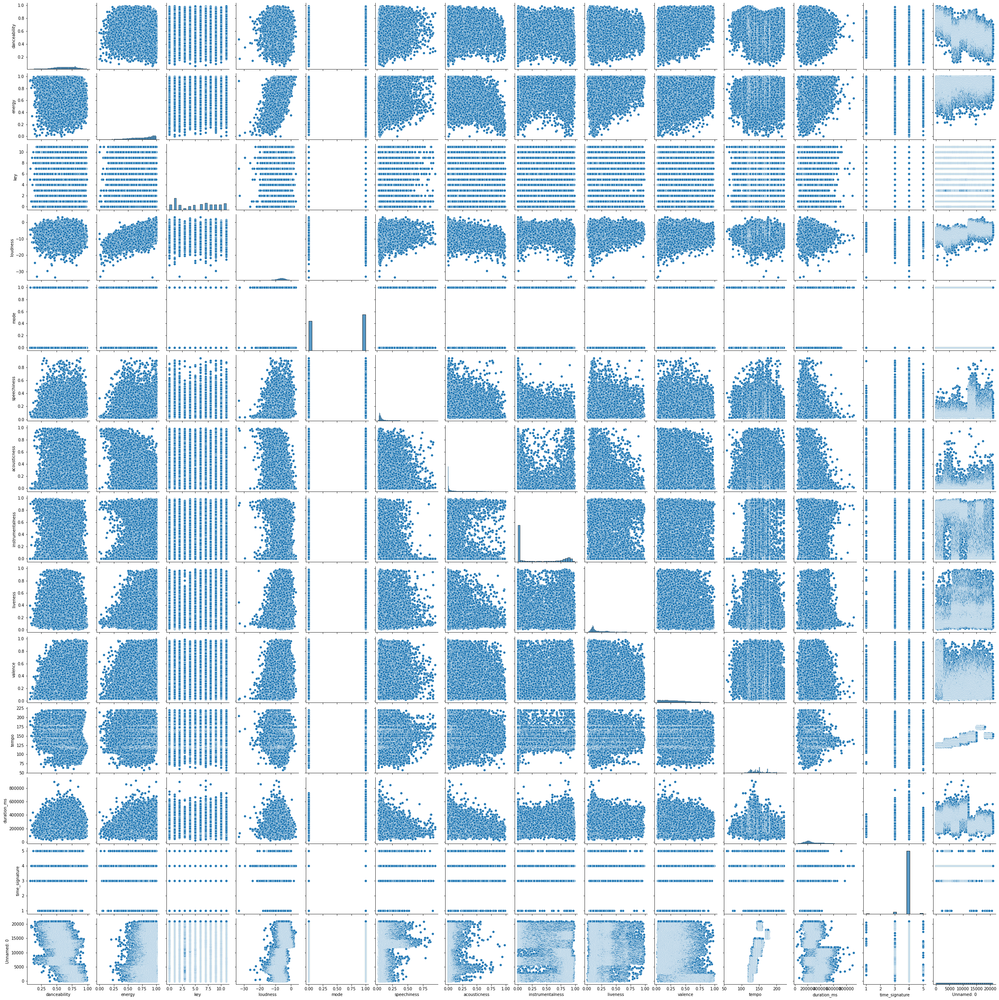

In [6]:
# representing the data in a pairplot()
sns.pairplot(df_genre)

Text(0.5, 1.0, 'Hisogram plot')

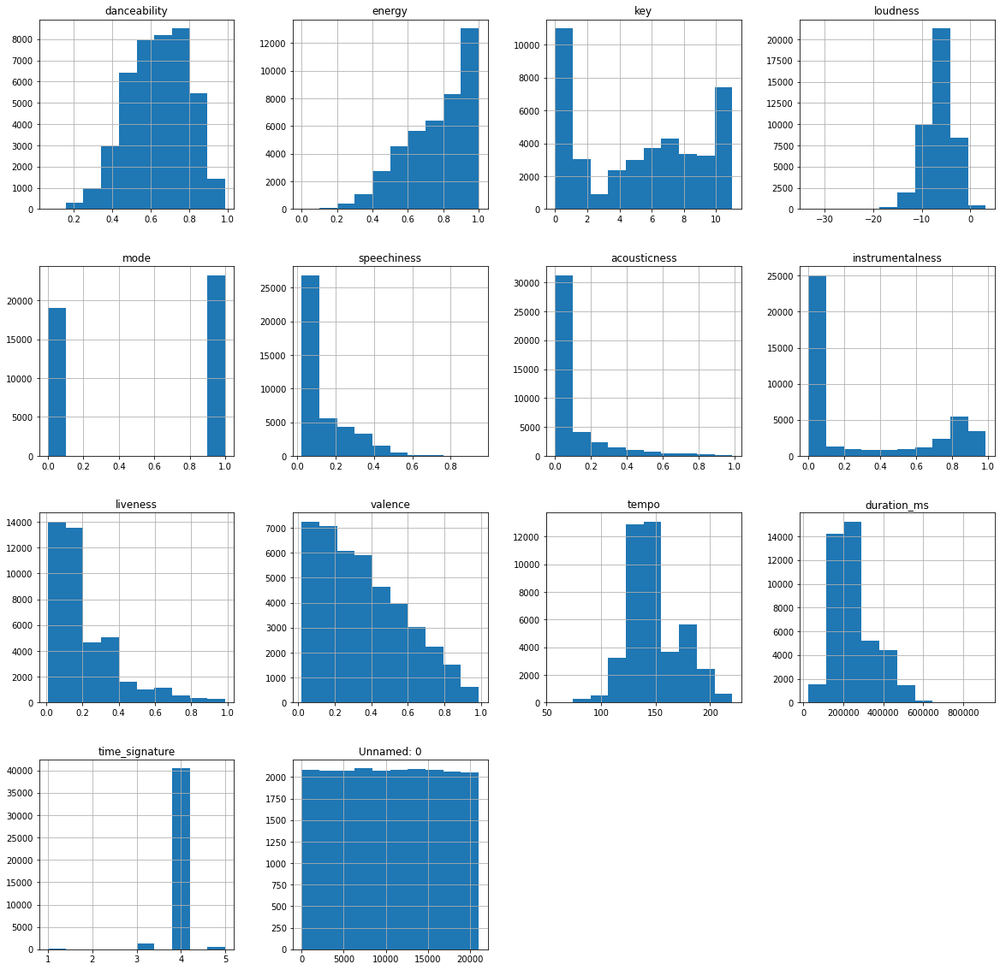

In [7]:
df_genre.hist(figsize=(20,20))
plt.title("Hisogram plot", size=15, weight='bold')

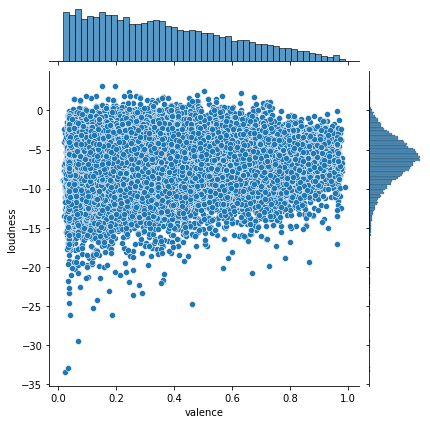

In [8]:
# Ploting scatter
sns.jointplot(x='valence',y='loudness',data=df_genre,kind='scatter')
plt.show()

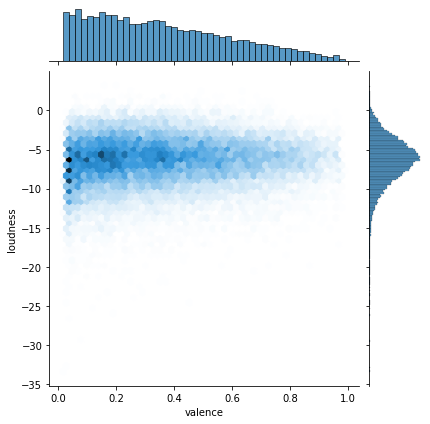

In [9]:
# Plotting HEX boxes
sns.jointplot(x='valence',y='loudness',data=df_genre,kind='hex')
plt.show()

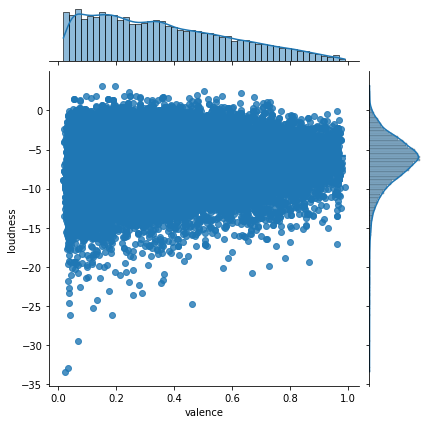

In [10]:
# Plotting Regression
sns.jointplot(x='valence',y='loudness',data=df_genre,kind='reg')
plt.show()

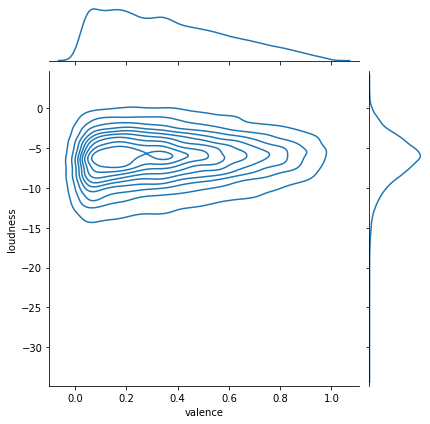

In [11]:
# Plotting KDE
sns.jointplot(x='valence',y='loudness',data=df_genre,kind='kde')
plt.show()

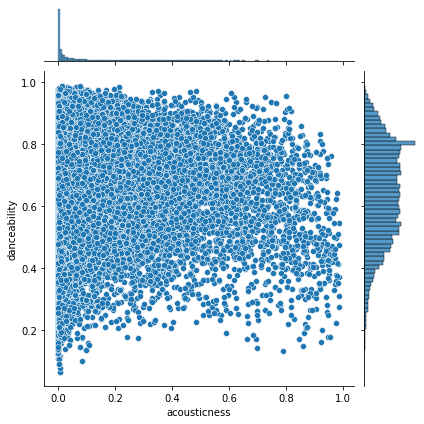

In [12]:
# Plotting Scatter
sns.jointplot(x='acousticness',y='danceability',data=df_genre,kind='scatter')
plt.show()

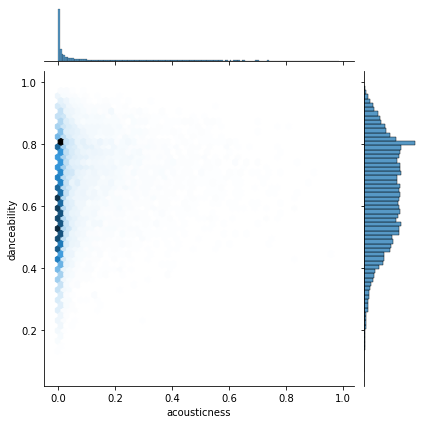

In [13]:
# Plotting Hex
sns.jointplot(x='acousticness',y='danceability',data=df_genre,kind='hex')
plt.show()

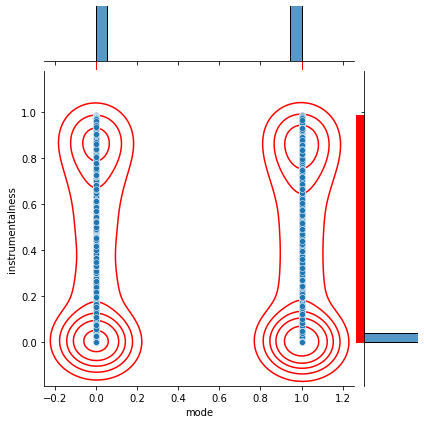

In [14]:
g = sns.jointplot(data=df_genre, x="mode", y="instrumentalness")
g.plot_joint(sns.kdeplot, color="r", zorder=0, levels=6)
g.plot_marginals(sns.rugplot, color="r", height=-.15, clip_on=False)

<Axes: xlabel='energy', ylabel='loudness'>

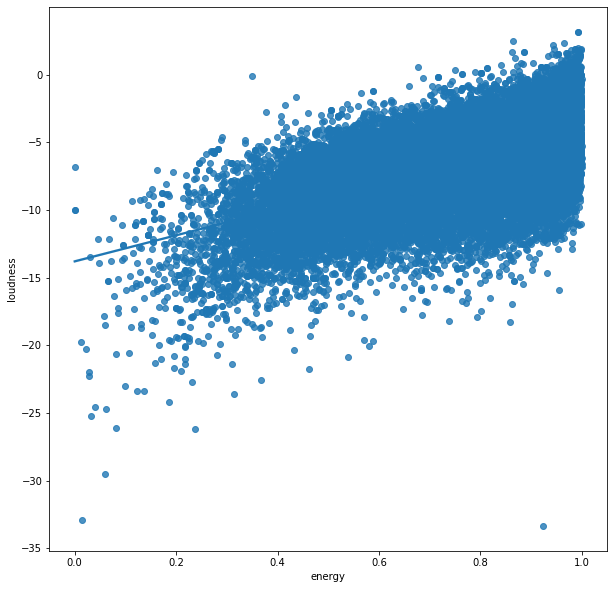

In [15]:
# relation between energy and loudness(db)
fig=plt.figure(figsize=(10,10))
sns.regplot(data=df_genre,x='energy',y='loudness')

In [16]:
df_genre.iloc[0]

danceability                                                    0.831
energy                                                          0.814
key                                                                 2
loudness                                                       -7.364
mode                                                                1
speechiness                                                      0.42
acousticness                                                   0.0598
instrumentalness                                               0.0134
liveness                                                       0.0556
valence                                                         0.389
tempo                                                         156.985
type                                                   audio_features
id                                             2Vc6NJ9PW9gD9q343XFRKx
uri                              spotify:track:2Vc6NJ9PW9gD9q343XFRKx
track_href          

In [18]:
df_playlists = pd.read_csv('playlists.csv')
df_playlists.head()

,Playlist,Genre
0,19WuHd4MxWLzE1fpMmw4S4,Dark Trap
1,6XyR8uzgkSoDzHuOxxRtLH,Dark Trap
2,37Ij3ofyhvEhFEH8YZMZ2X,Dark Trap
3,07zTlfPpsxeoWdumbkNWMI,Dark Trap
4,2dClSRLsnptdkDQnpi5H2f,Dark Trap


In [19]:
df_playlists.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 39 entries, 0 to 38
Data columns (total 2 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   Playlist  39 non-null     object
 1   Genre     39 non-null     object
dtypes: object(2)
memory usage: 752.0+ bytes


# **Modelling on genres**

In [138]:
df_genre['type'].value_counts()

audio_features    42305
Name: type, dtype: int64

In [139]:
final_dataframe = df_genre.drop(columns=['Unnamed: 0','type','id','uri','track_href','analysis_url','song_name'])
y = final_dataframe['genre']
final_dataframe = final_dataframe.drop(columns='genre')

In [140]:
final_dataframe

,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature,title
0,0.831,0.814,2,-7.364,1,0.4200,0.059800,0.013400,0.0556,0.3890,156.985,124539,4,NaN
1,0.719,0.493,8,-7.230,1,0.0794,0.401000,0.000000,0.1180,0.1240,115.080,224427,4,NaN
2,0.850,0.893,5,-4.783,1,0.0623,0.013800,0.000004,0.3720,0.0391,218.050,98821,4,NaN
3,0.476,0.781,0,-4.710,1,0.1030,0.023700,0.000000,0.1140,0.1750,186.948,123661,3,NaN
4,0.798,0.624,2,-7.668,1,0.2930,0.217000,0.000000,0.1660,0.5910,147.988,123298,4,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
42300,0.528,0.693,4,-5.148,1,0.0304,0.031500,0.000345,0.1210,0.3940,150.013,269208,4,Euphoric Hardstyle
42301,0.517,0.768,0,-7.922,0,0.0479,0.022500,0.000018,0.2050,0.3830,149.928,210112,4,Greatest Hardstyle Playlist
42302,0.361,0.821,8,-3.102,1,0.0505,0.026000,0.000242,0.3850,0.1240,154.935,234823,4,Best of Hardstyle 2020
42303,0.477,0.921,6,-4.777,0,0.0392,0.000551,0.029600,0.0575,0.4880,150.042,323200,4,Euphoric Hardstyle


In [141]:
100*final_dataframe.isna().sum()/len(final_dataframe)

danceability         0.000000
energy               0.000000
key                  0.000000
loudness             0.000000
mode                 0.000000
speechiness          0.000000
acousticness         0.000000
instrumentalness     0.000000
liveness             0.000000
valence              0.000000
tempo                0.000000
duration_ms          0.000000
time_signature       0.000000
title               50.880511
dtype: float64

In [142]:
def encode_categorical(df,column_name):
  # Create encoder
  ordinal_encoder = OrdinalEncoder(handle_unknown='use_encoded_value',unknown_value=-1)

  # Fit on training data
  ordinal_encoder.fit(df[column_name].values.reshape(-1, 1))

  # Transform the training data
  df[column_name] = ordinal_encoder.transform(df[column_name].values.reshape(-1, 1)).astype(int)
  return df[column_name]

In [143]:
final_dataframe_2 = final_dataframe
final_dataframe_2['title'] = encode_categorical(final_dataframe_2,'title')
final_dataframe_2['title'] = encode_categorical(final_dataframe_2,'title')

In [144]:
final_dataframe_2

,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature,title
0,0.831,0.814,2,-7.364,1,0.4200,0.059800,0.013400,0.0556,0.3890,156.985,124539,4,0
1,0.719,0.493,8,-7.230,1,0.0794,0.401000,0.000000,0.1180,0.1240,115.080,224427,4,0
2,0.850,0.893,5,-4.783,1,0.0623,0.013800,0.000004,0.3720,0.0391,218.050,98821,4,0
3,0.476,0.781,0,-4.710,1,0.1030,0.023700,0.000000,0.1140,0.1750,186.948,123661,3,0
4,0.798,0.624,2,-7.668,1,0.2930,0.217000,0.000000,0.1660,0.5910,147.988,123298,4,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
42300,0.528,0.693,4,-5.148,1,0.0304,0.031500,0.000345,0.1210,0.3940,150.013,269208,4,29
42301,0.517,0.768,0,-7.922,0,0.0479,0.022500,0.000018,0.2050,0.3830,149.928,210112,4,33
42302,0.361,0.821,8,-3.102,1,0.0505,0.026000,0.000242,0.3850,0.1240,154.935,234823,4,10
42303,0.477,0.921,6,-4.777,0,0.0392,0.000551,0.029600,0.0575,0.4880,150.042,323200,4,29


In [145]:
100*final_dataframe_2.isna().sum()/len(final_dataframe_2)

danceability        0.0
energy              0.0
key                 0.0
loudness            0.0
mode                0.0
speechiness         0.0
acousticness        0.0
instrumentalness    0.0
liveness            0.0
valence             0.0
tempo               0.0
duration_ms         0.0
time_signature      0.0
title               0.0
dtype: float64

In [146]:
final_dataframe_2['title'] = final_dataframe_2['title'].replace({0: np.nan})
final_dataframe_2

,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature,title
0,0.831,0.814,2,-7.364,1,0.4200,0.059800,0.013400,0.0556,0.3890,156.985,124539,4,NaN
1,0.719,0.493,8,-7.230,1,0.0794,0.401000,0.000000,0.1180,0.1240,115.080,224427,4,NaN
2,0.850,0.893,5,-4.783,1,0.0623,0.013800,0.000004,0.3720,0.0391,218.050,98821,4,NaN
3,0.476,0.781,0,-4.710,1,0.1030,0.023700,0.000000,0.1140,0.1750,186.948,123661,3,NaN
4,0.798,0.624,2,-7.668,1,0.2930,0.217000,0.000000,0.1660,0.5910,147.988,123298,4,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
42300,0.528,0.693,4,-5.148,1,0.0304,0.031500,0.000345,0.1210,0.3940,150.013,269208,4,29.0
42301,0.517,0.768,0,-7.922,0,0.0479,0.022500,0.000018,0.2050,0.3830,149.928,210112,4,33.0
42302,0.361,0.821,8,-3.102,1,0.0505,0.026000,0.000242,0.3850,0.1240,154.935,234823,4,10.0
42303,0.477,0.921,6,-4.777,0,0.0392,0.000551,0.029600,0.0575,0.4880,150.042,323200,4,29.0


In [147]:
# initialise
impute_bayes = IterativeImputer(estimator=BayesianRidge(),sample_posterior=True,random_state=0)
# fit and transform
X_impute_bayes = pd.DataFrame(impute_bayes.fit_transform(final_dataframe_2),columns=final_dataframe_2.columns,index=final_dataframe_2.index)

<Axes: >

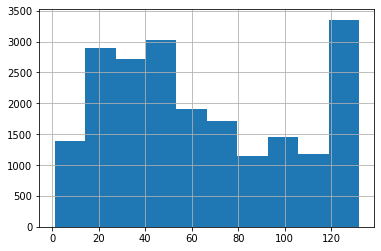

In [148]:
final_dataframe_2['title'].hist()

<Axes: >

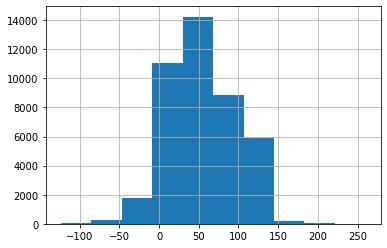

In [149]:
X_impute_bayes['title'].hist()

In [150]:
scaler = StandardScaler()
X_impute_bayes_scaled = scaler.fit_transform(X_impute_bayes)
X_impute_bayes_scaled

array([[ 1.22360786,  0.2800791 , -0.91929801, ..., -1.22699247,
         0.10218413,  0.0945266 ],
       [ 0.50847965, -1.46618532,  0.71731784, ..., -0.25679629,
         0.10218413, -1.21049882],
       [ 1.34492425,  0.70984511, -0.10099009, ..., -1.4767873 ,
         0.10218413, -0.20373209],
       ...,
       [-1.77737659,  0.31815963,  0.71731784, ..., -0.15582161,
         0.10218413, -1.07842621],
       [-1.03670809,  0.86216724,  0.17177922, ...,  0.70257007,
         0.10218413, -0.62124679],
       [-0.70468428,  0.99272907,  0.99008715, ..., -0.861576  ,
         0.10218413, -1.07842621]])

In [151]:
np.mean(X_impute_bayes_scaled),np.std(X_impute_bayes_scaled)

(-8.561016027122891e-17, 1.0)

In [152]:
feat_cols = ['feature'+str(i) for i in range(X_impute_bayes_scaled.shape[1])]
normalized_dataframe = pd.DataFrame(X_impute_bayes_scaled,columns=feat_cols)
normalized_dataframe.head()

,feature0,feature1,feature2,feature3,feature4,feature5,feature6,feature7,feature8,feature9,feature10,feature11,feature12,feature13
0,1.223608,0.280079,-0.919298,-0.305514,0.905517,2.246552,-0.212853,-0.727231,-0.902637,0.136790,0.398876,-1.226992,0.102184,0.094527
1,0.508480,-1.466185,0.717318,-0.259954,0.905517,-0.453057,1.784518,-0.763370,-0.547231,-0.999586,-1.358564,-0.256796,0.102184,-1.210499
2,1.344924,0.709845,-0.100990,0.572039,0.905517,-0.588592,-0.482135,-0.763359,0.899456,-1.363655,2.959861,-1.476787,0.102184,-0.203732
3,-1.043093,0.100557,-1.464837,0.596860,0.905517,-0.266002,-0.424181,-0.763370,-0.570013,-0.780887,1.655485,-1.235520,-3.624453,0.750754
4,1.012900,-0.753535,-0.919298,-0.408876,0.905517,1.239945,0.707390,-0.763370,-0.273841,1.003008,0.021554,-1.239046,0.102184,0.001634


# **PCA on genres**

In [153]:
from sklearn.decomposition import PCA
pca_genre = PCA(n_components=2)
principalComponents_genre = pca_genre.fit_transform(X_impute_bayes_scaled)

In [154]:
principal_genre = pd.DataFrame(data = principalComponents_genre, columns = ['principal component 1', 'principal component 2'])
principal_genre.head()

,principal component 1,principal component 2
0,1.937420,-0.556536
1,1.645236,1.576334
2,0.605345,-1.849391
3,0.302682,-1.241673
4,2.464158,0.040472


In [155]:
print('Explained variation per principal component: {}'.format(pca_genre.explained_variance_ratio_ ))

Explained variation per principal component: [0.19488649 0.13871656]


In [156]:
y.unique()

array(['Dark Trap', 'Underground Rap', 'Trap Metal', 'Emo', 'Rap', 'RnB',
       'Pop', 'Hiphop', 'techhouse', 'techno', 'trance', 'psytrance',
       'trap', 'dnb', 'hardstyle'], dtype=object)

<Figure size 432x288 with 0 Axes>

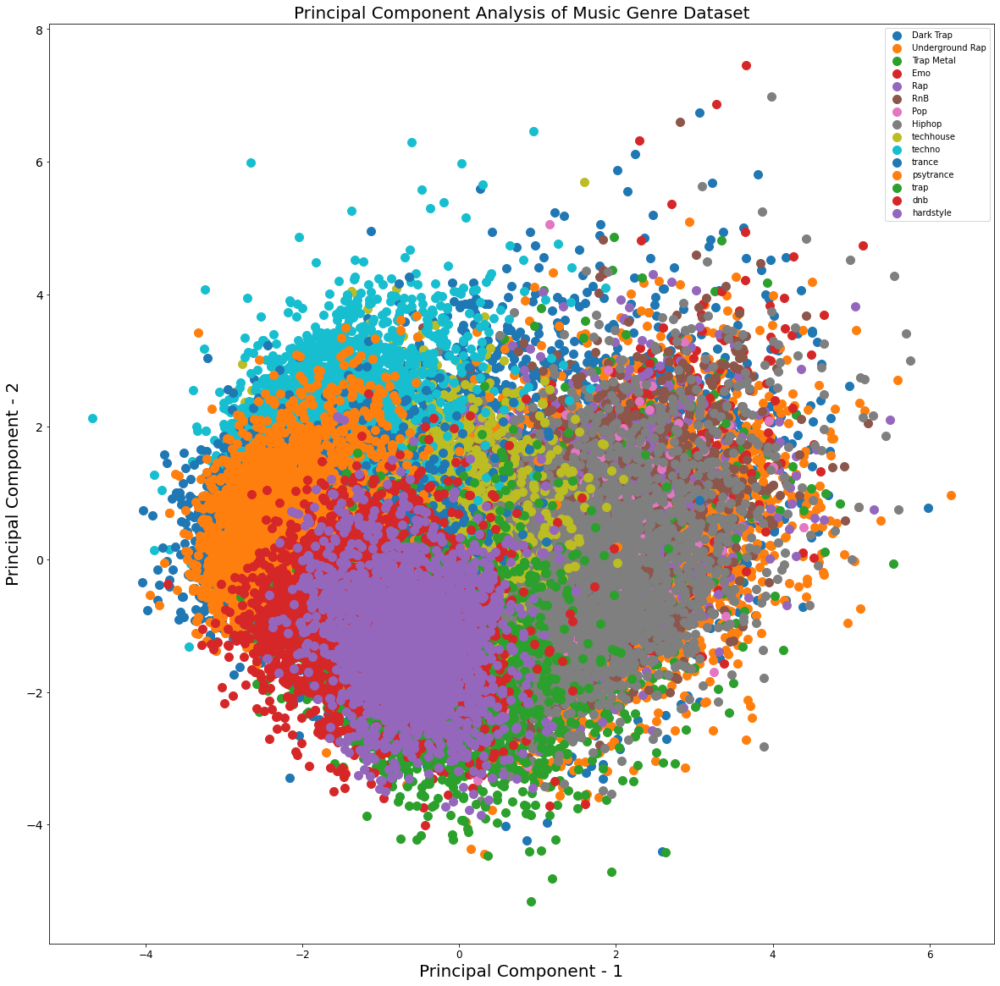

In [157]:
plt.figure()
plt.figure(figsize=(20,20))
plt.xticks(fontsize=12)
plt.yticks(fontsize=14)
plt.xlabel('Principal Component - 1',fontsize=20)
plt.ylabel('Principal Component - 2',fontsize=20)
plt.title("Principal Component Analysis of Music Genre Dataset",fontsize=20)
targets = y.unique()

for target in targets:
    indicesToKeep = df_genre['genre'] == target
    plt.scatter(principal_genre.loc[indicesToKeep, 'principal component 1']
               , principal_genre.loc[indicesToKeep, 'principal component 2'], s = 100)

plt.legend(targets,prop={'size':10})

In [158]:
from sklearn.neighbors import NeighborhoodComponentsAnalysis,KNeighborsClassifier
from sklearn.pipeline import Pipeline
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X_impute_bayes_scaled, y, stratify=y, test_size=0.7, random_state=42)
nca = NeighborhoodComponentsAnalysis(random_state=42)
knn = KNeighborsClassifier(n_neighbors=3)
nca_pipe = Pipeline([('nca', nca), ('knn', knn)])
nca_pipe.fit(X_train, y_train)
print(nca_pipe.score(X_test, y_test))

0.6146754913216722


# **Clustering song names and suggesting new ones**

In [100]:
song_name_dataframe = df_genre.drop(columns=['Unnamed: 0','type','id','uri','track_href','analysis_url']).drop_duplicates(subset=['song_name'])
song_name_dataframe.head()

,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature,genre,song_name,title
0,0.831,0.814,2,-7.364,1,0.4200,0.0598,0.013400,0.0556,0.3890,156.985,124539,4,Dark Trap,Mercury: Retrograde,NaN
1,0.719,0.493,8,-7.230,1,0.0794,0.4010,0.000000,0.1180,0.1240,115.080,224427,4,Dark Trap,Pathology,NaN
2,0.850,0.893,5,-4.783,1,0.0623,0.0138,0.000004,0.3720,0.0391,218.050,98821,4,Dark Trap,Symbiote,NaN
3,0.476,0.781,0,-4.710,1,0.1030,0.0237,0.000000,0.1140,0.1750,186.948,123661,3,Dark Trap,ProductOfDrugs (Prod. The Virus and Antidote),NaN
4,0.798,0.624,2,-7.668,1,0.2930,0.2170,0.000000,0.1660,0.5910,147.988,123298,4,Dark Trap,Venom,NaN


In [101]:
song_name_dataframe['genre'] = encode_categorical(song_name_dataframe,'genre')
song_name_dataframe['title'] = encode_categorical(song_name_dataframe,'title')
song_name_dataframe['title'] = encode_categorical(song_name_dataframe,'title')

In [102]:
song_name_dataframe

,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature,genre,song_name,title
0,0.831,0.814,2,-7.364,1,0.4200,0.05980,0.013400,0.0556,0.3890,156.985,124539,4,0,Mercury: Retrograde,0
1,0.719,0.493,8,-7.230,1,0.0794,0.40100,0.000000,0.1180,0.1240,115.080,224427,4,0,Pathology,0
2,0.850,0.893,5,-4.783,1,0.0623,0.01380,0.000004,0.3720,0.0391,218.050,98821,4,0,Symbiote,0
3,0.476,0.781,0,-4.710,1,0.1030,0.02370,0.000000,0.1140,0.1750,186.948,123661,3,0,ProductOfDrugs (Prod. The Virus and Antidote),0
4,0.798,0.624,2,-7.668,1,0.2930,0.21700,0.000000,0.1660,0.5910,147.988,123298,4,0,Venom,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21519,0.526,0.819,7,-6.728,1,0.2980,0.00206,0.000003,0.3360,0.5810,159.910,281886,4,2,"H20 (feat. Pharoahe Monch, Rakaa Iriscience, &...",0
21520,0.538,0.819,1,-6.780,1,0.4670,0.00854,0.000000,0.1310,0.2520,160.299,209582,4,2,Daddy's Girl,0
21521,0.415,0.548,7,-8.563,1,0.2850,0.22400,0.000000,0.1220,0.5280,154.272,213898,4,2,'94,0
21522,0.785,0.648,7,-6.907,1,0.2790,0.01570,0.001980,0.1000,0.5060,184.160,271867,4,2,Born 2 Live,0


In [103]:
song_name_dataframe = song_name_dataframe.dropna()
y = song_name_dataframe['song_name']
song_name_dataframe = song_name_dataframe.drop(columns='song_name')
song_name_dataframe

,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature,genre,title
0,0.831,0.814,2,-7.364,1,0.4200,0.05980,0.013400,0.0556,0.3890,156.985,124539,4,0,0
1,0.719,0.493,8,-7.230,1,0.0794,0.40100,0.000000,0.1180,0.1240,115.080,224427,4,0,0
2,0.850,0.893,5,-4.783,1,0.0623,0.01380,0.000004,0.3720,0.0391,218.050,98821,4,0,0
3,0.476,0.781,0,-4.710,1,0.1030,0.02370,0.000000,0.1140,0.1750,186.948,123661,3,0,0
4,0.798,0.624,2,-7.668,1,0.2930,0.21700,0.000000,0.1660,0.5910,147.988,123298,4,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21519,0.526,0.819,7,-6.728,1,0.2980,0.00206,0.000003,0.3360,0.5810,159.910,281886,4,2,0
21520,0.538,0.819,1,-6.780,1,0.4670,0.00854,0.000000,0.1310,0.2520,160.299,209582,4,2,0
21521,0.415,0.548,7,-8.563,1,0.2850,0.22400,0.000000,0.1220,0.5280,154.272,213898,4,2,0
21522,0.785,0.648,7,-6.907,1,0.2790,0.01570,0.001980,0.1000,0.5060,184.160,271867,4,2,0


In [105]:
scaler = StandardScaler()
song_name_dataframe_scaled = scaler.fit_transform(song_name_dataframe)
song_name_dataframe_scaled

array([[ 1.01777525,  0.87701349, -0.85570739, ...,  0.10028574,
        -1.21330469,  0.        ],
       [ 0.32306446, -0.92173508,  0.77079509, ...,  0.10028574,
        -1.21330469,  0.        ],
       [ 1.13562798,  1.31969616, -0.04245615, ...,  0.10028574,
        -1.21330469,  0.        ],
       ...,
       [-1.56257913, -0.61353828,  0.49971134, ...,  0.10028574,
        -0.51759946,  0.        ],
       [ 0.73244761, -0.05318047,  0.49971134, ...,  0.10028574,
        -0.51759946,  0.        ],
       [ 0.49674216,  0.97787789, -0.58462364, ...,  0.10028574,
        -0.51759946,  0.        ]])

# **K-Nearest Neighbors for music suggestion**

In [106]:
y

0                                      Mercury: Retrograde
1                                                Pathology
2                                                 Symbiote
3            ProductOfDrugs (Prod. The Virus and Antidote)
4                                                    Venom
                               ...                        
21519    H20 (feat. Pharoahe Monch, Rakaa Iriscience, &...
21520                                         Daddy's Girl
21521                                                  '94
21522                                          Born 2 Live
21523                                        Can't Hold On
Name: song_name, Length: 15439, dtype: object

In [124]:
y[y.values=='Still D.R.E.'].index

Int64Index([7676], dtype='int64')

In [108]:
y[7676]

'Still D.R.E.'

In [109]:
from sklearn.neighbors import NearestCentroid

clf = NearestCentroid()
clf.fit(song_name_dataframe_scaled, y)

NearestCentroid()

In [110]:
song_name_dataframe_scaled[7676]

array([ 0.63320321,  0.72571688,  1.58404633,  1.08198708,  0.85375136,
        1.33501691,  0.09191087, -0.3698148 , -0.43624655,  1.78599987,
       -0.88260694, -0.59539889,  0.10028574,  1.22166361,  0.        ])

In [125]:
print(clf.predict([song_name_dataframe_scaled[y[y.values=='Still D.R.E.'].index[0]]]))

['BOP']


In [134]:
def music_suggestion():
  song_name = str(input())
  return 'Suggested song: ' + clf.predict([song_name_dataframe_scaled[y[y.values==song_name].index[0]]])[0]

In [135]:
music_suggestion()

Still D.R.E.


'Suggested song: BOP'

In [137]:
music_suggestion()

BOP


'Suggested song: RESPECT'